In [1]:
from __future__ import division

import json
from glob import glob
from tqdm import tqdm
import sys, os
import pandas as pd
import scanpy as sc
import scvelo as scv
import hotspot
import numpy as np
import scipy
from scipy import stats
import itertools
import warnings
from collections import OrderedDict 
from scipy.stats import zscore
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.metrics.pairwise import cosine_similarity as cosine_similarity_sklearn
import anndata
#plotting
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import matplotlib.ticker as ticker
import seaborn as sns
warnings.simplefilter(action='ignore', category=FutureWarning)

Global seed set to 0
/gstore/home/melocars/.conda/envs/mambapy38/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/gstore/home/melocars/.conda/envs/mambapy38/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
sys.path.append("utils/")
import utils as utils

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
# Plotting style
sc.settings.set_figure_params(dpi=120, fontsize=10, dpi_save=300, frameon=False, format='pdf')
sc.settings.verbosity = 0
sns.set_style(style="white")
sns.set_style("ticks")

In [5]:
with open("data/clean_modules_IP_IT.json") as json_file:
    final_modules = json.load(json_file)

In [6]:
final_modules

{'I4a': ['Lgmn', 'Arg1', 'Fn1', 'S100a6', 'Ccl9', 'S100a4'],
 'I4b': ['Ctsd',
  'Fabp5',
  'Psap',
  'Cd63',
  'Gpnmb',
  'Ctss',
  'Cstb',
  'Lgals3',
  'Sgk1',
  'Spp1',
  'Ctsl'],
 'I4c': ['Cd9', 'Fth1', 'Msrb1', 'Atp6v0d2', 'Tmsb10', 'Txn1', 'Chil3'],
 'I4d': ['Plet1', 'Wfdc21', 'Ear2', 'Ltc4s']}

In [7]:
genes = []
for el in final_modules:
    genes += final_modules[el]

# Figure 5a

Load HotSpot results computed on the IM population from IT and IP

In [8]:
hotspot_object = "data/IT_N2_IM.hs.pickle"
min_gene_threshold = 20

In [9]:
hs = utils.unpickling(hotspot_object)

In [10]:
modules = hs.create_modules(
        min_gene_threshold=min_gene_threshold, core_only=True, fdr_threshold=0.005)

In [11]:
module_scores = hs.calculate_module_scores()
module_scores = anndata.AnnData(X=module_scores)
module_scores.obs = hs.adata.obs.copy()
module_scores.obsm['X_umap'] = hs.adata.obsm['X_umap'].copy()

Computing scores for 20 modules...


100%|██████████| 20/20 [00:03<00:00,  5.96it/s]


In [12]:
subset_local_correlation = hs.local_correlation_z.loc[genes][genes]

In [13]:
subset_modules = modules.loc[genes]

# Join modules manually

subset_modules.loc[subset_modules==3] = 6
subset_modules.loc[subset_modules==12] = 11

In [14]:
higlight_modules = {
    0:6, 
    6:11,
    17:7,
    24:4,
}

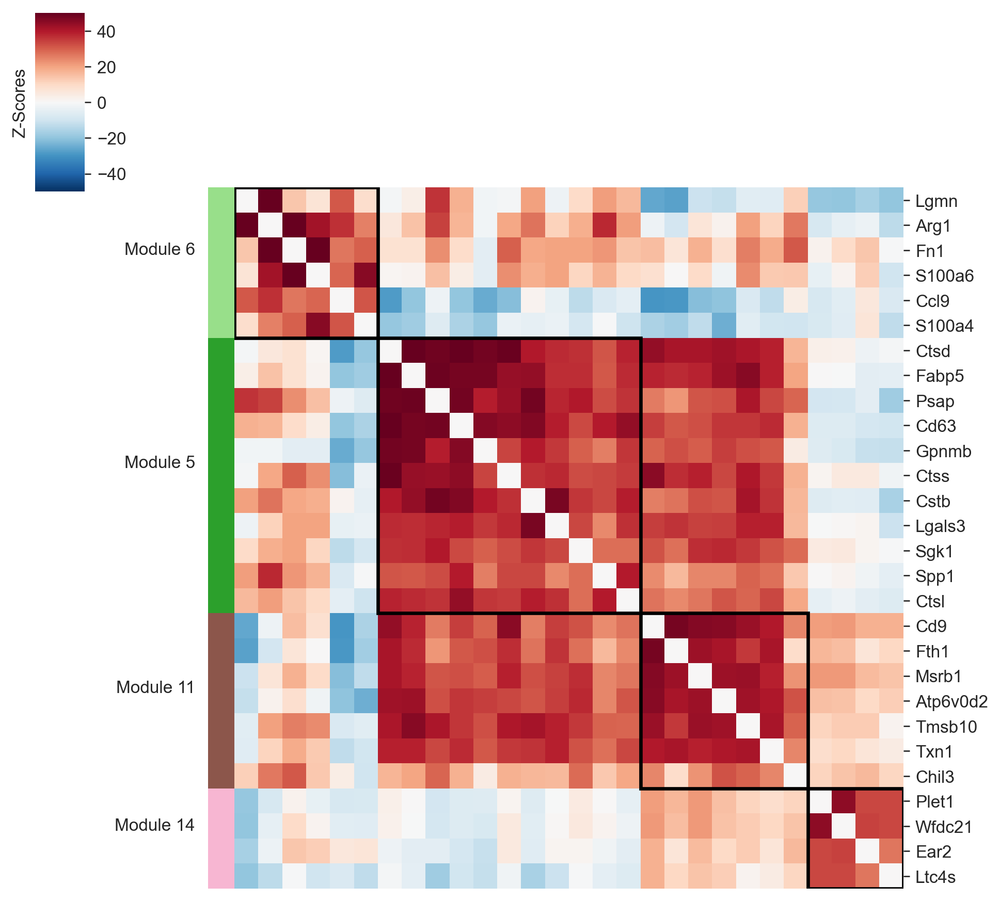

In [15]:
utils.local_correlation_plot(subset_local_correlation, subset_modules, 
                       mod_cmap='tab20', vmin=-50, vmax=50, z_cmap='RdBu_r', yticklabels=True, figsize=(8,8), 
                       higlight_modules=higlight_modules)

# Load adatas

In [16]:
adatas = {}

adatas['IP_IT'] = sc.read_h5ad('data/IP_IT.h5ad')
adatas['IP'] = sc.read_h5ad('data/IP_N2vel.h5ad')
adatas['IT'] = sc.read_h5ad('data/IT_N2vel.h5ad')
adatas['ITt'] = sc.read_h5ad('data/ITt.proc.myeloid.h5ad')

In [17]:
sc.pp.normalize_total(adatas['IP_IT'], target_sum=10000)
sc.pp.log1p(adatas['IP_IT'])

# Extended Figure 5a

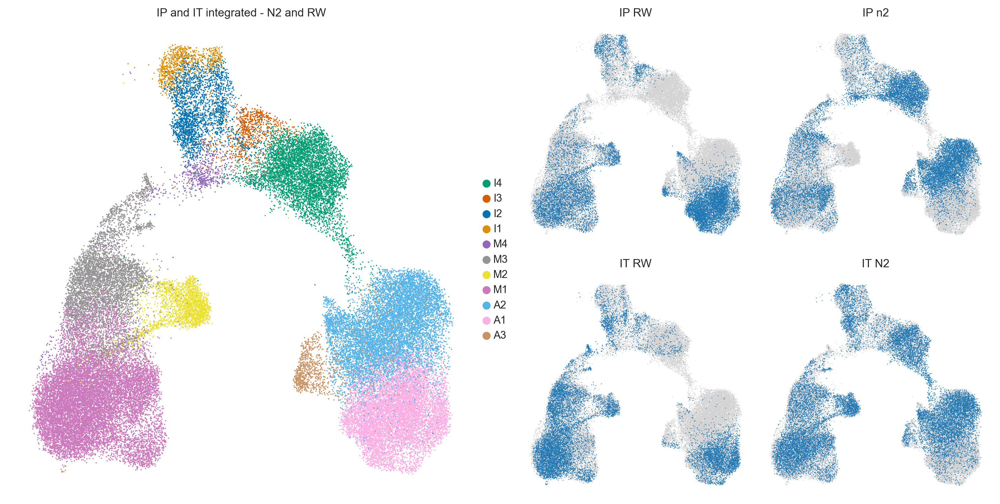

In [18]:
with plt.rc_context({"figure.figsize": (5, 4)}):
    fig3 = plt.figure(constrained_layout=True, figsize=(12, 6))
    gs = fig3.add_gridspec(2, 4)
    f3_ax1 = fig3.add_subplot(gs[0:, :-2])
    sc.pl.umap(adatas['IP_IT'], color='combined_clusters', title='IP and IT integrated - N2 and RW', s=5, show=False, ax=f3_ax1)
    
    f3_ax2 = fig3.add_subplot(gs[0, 2])
    utils.highlight(adatas['IP_IT'], 'treatment', 'RW', 'IP RW', ax=f3_ax2)
    
    f3_ax3 = fig3.add_subplot(gs[0, 3])
    utils.highlight(adatas['IP_IT'], 'treatment', 'N2', 'IP n2', ax=f3_ax3)
    
    f3_ax4 = fig3.add_subplot(gs[1, 2])
    utils.highlight(adatas['IP_IT'], 'treatment', 'Intratracheal_RW', 'IT RW', ax=f3_ax4)
    
    f3_ax5 = fig3.add_subplot(gs[1, 3])
    utils.highlight(adatas['IP_IT'], 'treatment', 'Intratracheal_N2', 'IT N2', ax=f3_ax5)

# Supplemental figure 5e

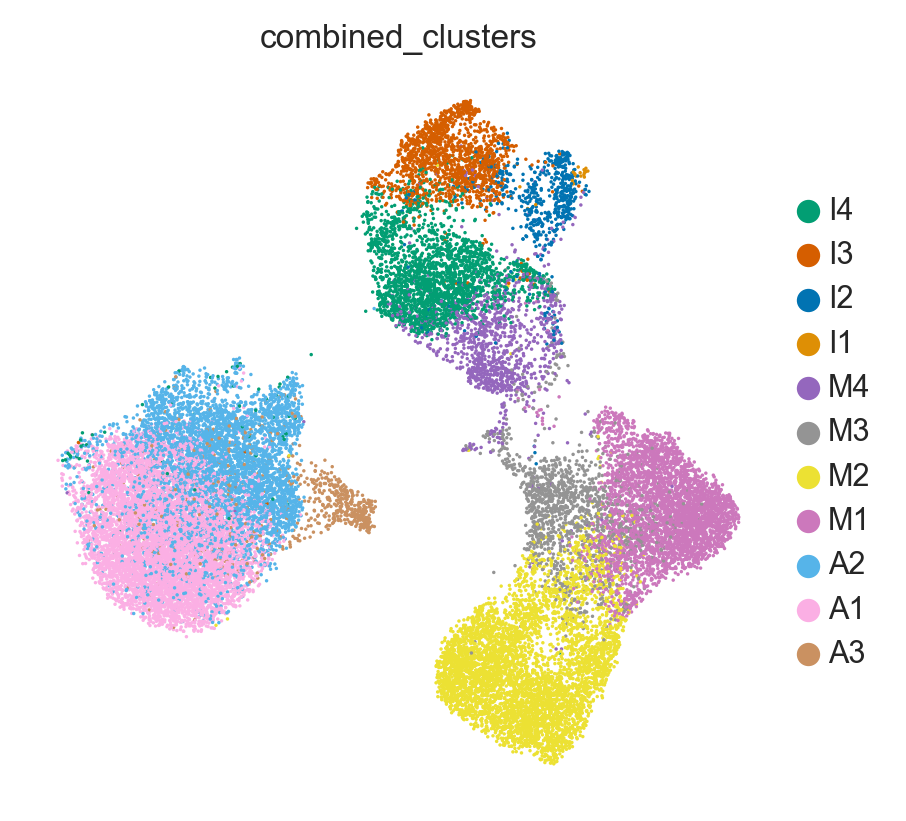

In [19]:
sc.pl.umap(adatas['ITt'], color='combined_clusters')

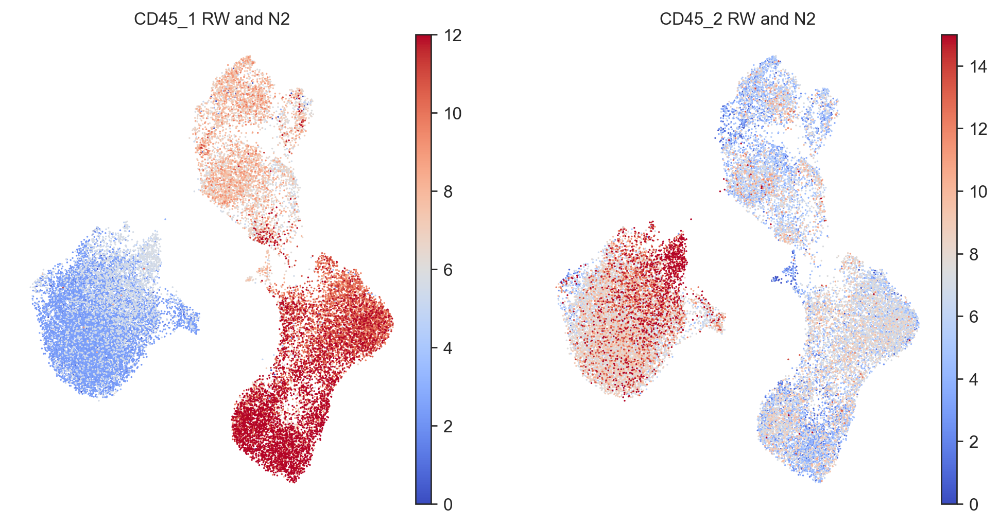

In [20]:
vmax1 = 12
vmax2 = 15
vmin = 0

with plt.rc_context({"font.size" : 12}):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

    sc.pl.umap(adatas['ITt'],
               color='CD45_1', show=False, title='CD45_1 RW and N2', legend_loc='', ax=ax1, cmap='coolwarm', vmax=vmax1, vmin=vmin)

    sc.pl.umap(adatas['ITt'],
               color='CD45_2', show=False, title='CD45_2 RW and N2', legend_loc='', ax=ax2, cmap='coolwarm', vmax=vmax2, vmin=vmin)
    

# Figure 5b

In [21]:
for el in adatas:
    for g in final_modules:
        sc.tl.score_genes(adatas[el], gene_list=final_modules[g], score_name=g, use_raw=False)
        adatas[el].obs[f'MinMax_{g}'] = adatas[el].obs[g].transform(lambda x:utils.minMax(x))

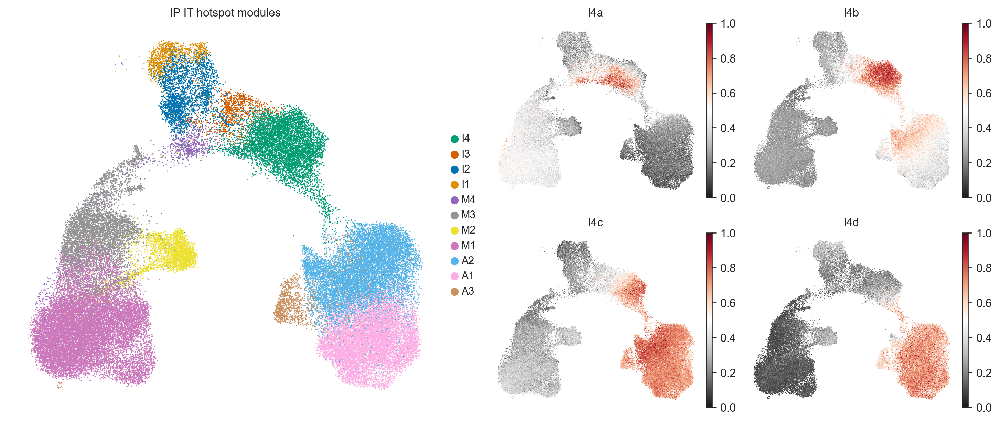

In [22]:
k = 'IP_IT'
with plt.rc_context({"figure.figsize": (5, 4)}):
    fig3 = plt.figure(constrained_layout=True, figsize=(12, 5))
    gs = fig3.add_gridspec(2, 4)
    f3_ax1 = fig3.add_subplot(gs[0:, :-2])
    sc.pl.umap(adatas[k], color='combined_clusters', title='IP IT hotspot modules', s=5, show=False, ax=f3_ax1)
    f3_ax2 = fig3.add_subplot(gs[0, 2])
    sc.pl.umap(adatas[k], color='MinMax_I4a', title='I4a', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax2)
    f3_ax3 = fig3.add_subplot(gs[0, 3])
    sc.pl.umap(adatas[k], color='MinMax_I4b', title='I4b', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax3)
    f3_ax4 = fig3.add_subplot(gs[1, 2])
    sc.pl.umap(adatas[k], color='MinMax_I4c', title='I4c', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax4)
    f3_ax5 = fig3.add_subplot(gs[1, 3])
    sc.pl.umap(adatas[k], color='MinMax_I4d', title='I4d', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax5)


# Supplemental Figure 5b

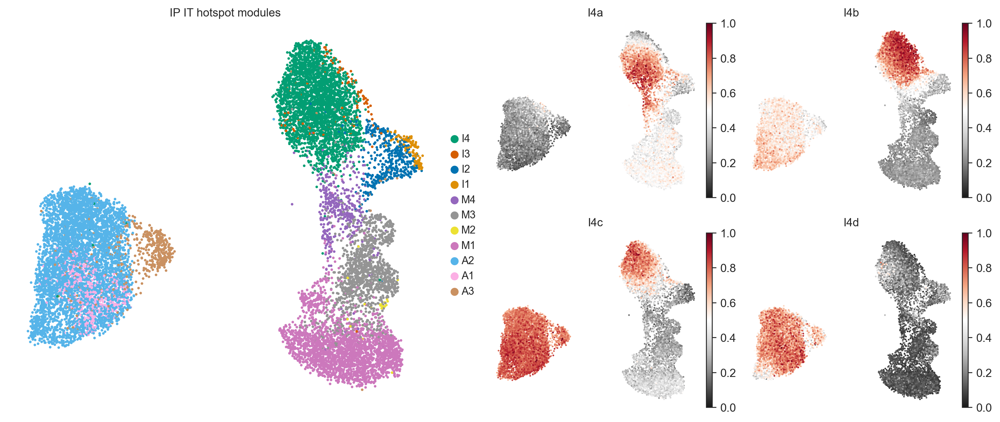

In [23]:
k = 'IP'
with plt.rc_context({"figure.figsize": (5, 4)}):
    fig3 = plt.figure(constrained_layout=True, figsize=(12, 5))
    gs = fig3.add_gridspec(2, 4)
    f3_ax1 = fig3.add_subplot(gs[0:, :-2])
    sc.pl.umap(adatas[k], color='combined_clusters', title='IP IT hotspot modules', s=20, show=False, ax=f3_ax1)
    f3_ax2 = fig3.add_subplot(gs[0, 2])
    sc.pl.umap(adatas[k], color='MinMax_I4a', title='I4a', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax2)
    f3_ax3 = fig3.add_subplot(gs[0, 3])
    sc.pl.umap(adatas[k], color='MinMax_I4b', title='I4b', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax3)
    f3_ax4 = fig3.add_subplot(gs[1, 2])
    sc.pl.umap(adatas[k], color='MinMax_I4c', title='I4c', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax4)
    f3_ax5 = fig3.add_subplot(gs[1, 3])
    sc.pl.umap(adatas[k], color='MinMax_I4d', title='I4d', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax5)


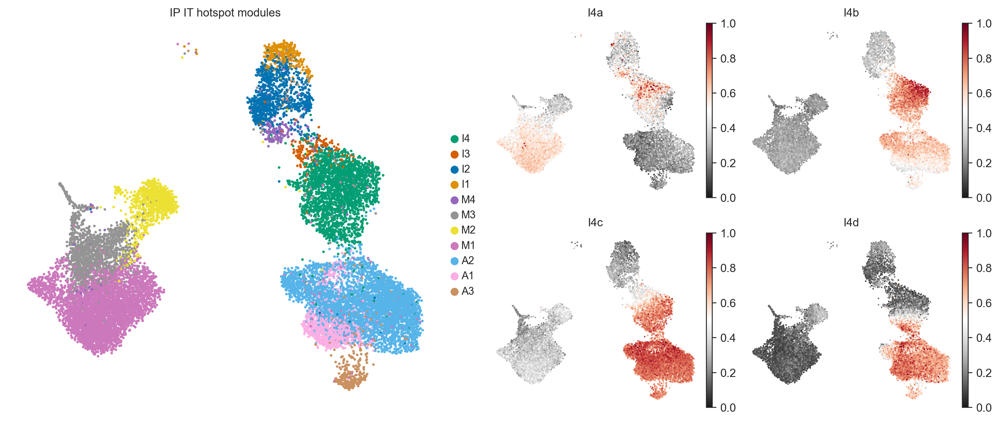

In [24]:
k = 'IT'
with plt.rc_context({"figure.figsize": (5, 4)}):
    fig3 = plt.figure(constrained_layout=True, figsize=(12, 5))
    gs = fig3.add_gridspec(2, 4)
    f3_ax1 = fig3.add_subplot(gs[0:, :-2])
    sc.pl.umap(adatas[k], color='combined_clusters', title='IP IT hotspot modules', s=20, show=False, ax=f3_ax1)
    f3_ax2 = fig3.add_subplot(gs[0, 2])
    sc.pl.umap(adatas[k], color='MinMax_I4a', title='I4a', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax2)
    f3_ax3 = fig3.add_subplot(gs[0, 3])
    sc.pl.umap(adatas[k], color='MinMax_I4b', title='I4b', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax3)
    f3_ax4 = fig3.add_subplot(gs[1, 2])
    sc.pl.umap(adatas[k], color='MinMax_I4c', title='I4c', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax4)
    f3_ax5 = fig3.add_subplot(gs[1, 3])
    sc.pl.umap(adatas[k], color='MinMax_I4d', title='I4d', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax5)


# Figure 5c

IP


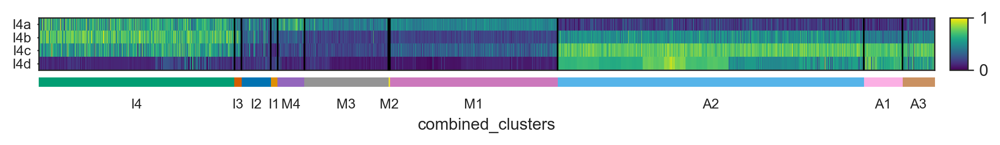

IT


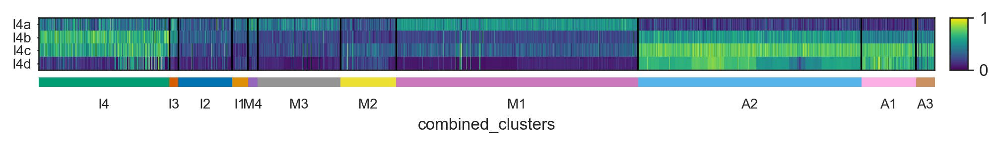

In [25]:
# To make differences clearer, sort by I4d first
for el in ['IP', 'IT']:
    print(el)
    gg = adatas[el].copy()
    gg.obs = gg.obs.sort_values(by='I4d', ascending=True)

    with plt.rc_context({"figure.figsize": (5, 4)}):
        sc.pl.heatmap(gg, var_names=[g for g in final_modules], groupby='combined_clusters', swap_axes=True, cmap='viridis', standard_scale='var')

# Figure 5f

ITt


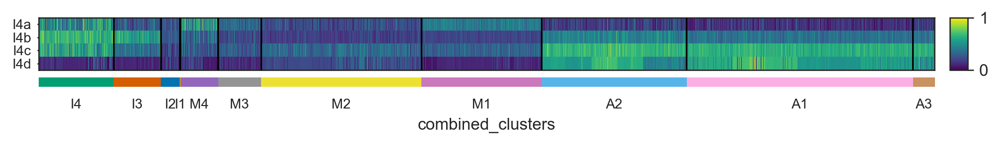

In [26]:
# To make differences clearer, sort by I4d first
for el in ['ITt']:
    print(el)
    gg = adatas[el].copy()
    gg.obs = gg.obs.sort_values(by='I4d', ascending=True)

    with plt.rc_context({"figure.figsize": (5, 4)}):
        sc.pl.heatmap(gg, var_names=[g for g in final_modules], groupby='combined_clusters', swap_axes=True, cmap='viridis', standard_scale='var')

# Process velocity for transplant experiment

In [27]:
out_files = {}

out_files = {'ITt_RW': 'data/ITt_RWvel.h5ad',
             'ITt_N2': 'data/ITt_N2vel.h5ad'}

In [28]:
adatasT = {}

for el in out_files:
    if os.path.exists(out_files[el]):
        print("Loading files")
        adatasT[el] = sc.read_h5ad(out_files[el])
    else:
        split_by = "concise_annotation"
        adata = sc.read_h5ad("data/ITt.h5ad")
        adatasT[el] = adata[adata.obs[split_by]==el]
        adatasT[el] = utils.basic_proc_for_velocity(adatasT[el])
        adatasT[el].write(out_files[el])


Loading files
Loading files


# Figure 5c

computing velocity embedding
    finished (0:00:05) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
computing velocity embedding
    finished (0:00:06) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


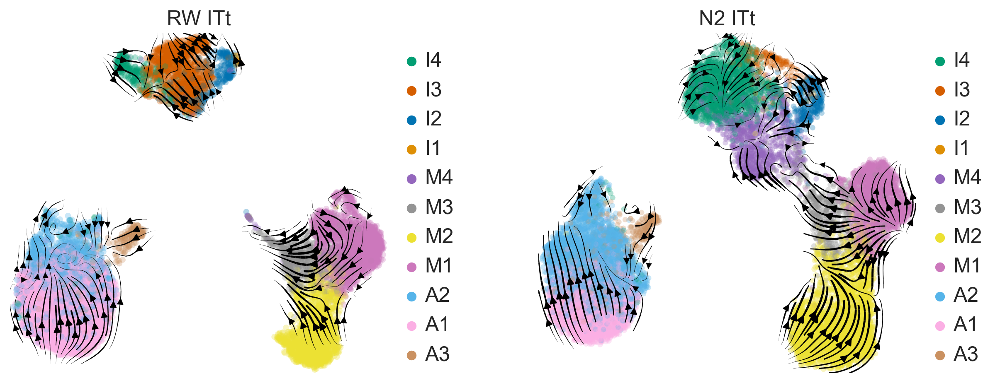

In [29]:
with plt.rc_context({"figure.figsize": (10, 5), "font.size" : 15}):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4.5))
    scv.pl.velocity_embedding_stream(adatasT['ITt_RW'], color='combined_clusters', title='RW ITt', density=2.5, show=False, 
                                     legend_loc='upper right', legend_fontsize=15, ax=ax1)
    scv.pl.velocity_embedding_stream(adatasT['ITt_N2'], color='combined_clusters', title='N2 ITt', density=2.5, show=False, 
                                     legend_loc='upper right', legend_fontsize=15, ax=ax2)
    f.subplots_adjust(wspace=0.4, left=0.05)

# Figure 5e

In [30]:
for el in adatasT:
    for g in final_modules:
        sc.tl.score_genes(adatasT[el], gene_list=final_modules[g], score_name=g, use_raw=False)
        adatasT[el].obs[f'MinMax_{g}'] = adatasT[el].obs[g].transform(lambda x:utils.minMax(x))

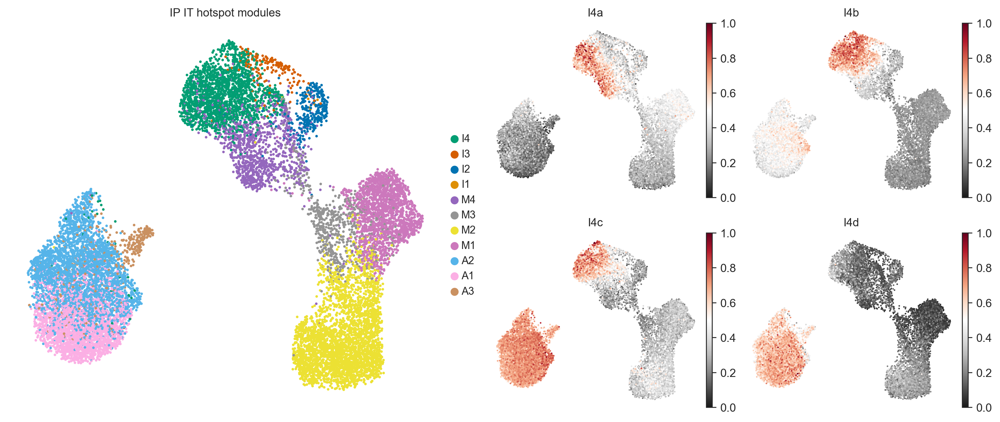

In [31]:
k = 'ITt_N2'
with plt.rc_context({"figure.figsize": (5, 4)}):
    fig3 = plt.figure(constrained_layout=True, figsize=(12, 5))
    gs = fig3.add_gridspec(2, 4)
    f3_ax1 = fig3.add_subplot(gs[0:, :-2])
    sc.pl.umap(adatasT[k], color='combined_clusters', title='IP IT hotspot modules', s=20, show=False, ax=f3_ax1)
    f3_ax2 = fig3.add_subplot(gs[0, 2])
    sc.pl.umap(adatasT[k], color='MinMax_I4a', title='I4a', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax2)
    f3_ax3 = fig3.add_subplot(gs[0, 3])
    sc.pl.umap(adatasT[k], color='MinMax_I4b', title='I4b', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax3)
    f3_ax4 = fig3.add_subplot(gs[1, 2])
    sc.pl.umap(adatasT[k], color='MinMax_I4c', title='I4c', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax4)
    f3_ax5 = fig3.add_subplot(gs[1, 3])
    sc.pl.umap(adatasT[k], color='MinMax_I4d', title='I4d', legend_loc='', show=False, cmap='RdGy_r', ax=f3_ax5)


# Supplemental figure 5f

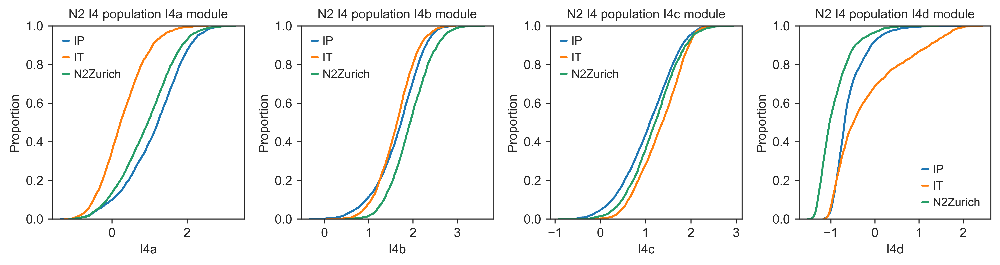

In [32]:
with plt.rc_context({"figure.dpi": (300)}):
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='col', figsize=(11,3))

    p = 'I4'
    utils.plot_cluster(
        adatas['IP'], 
        adatas['IT'],
        adatasT['ITt_N2'],
        p, 'I4a', 1, 0.1, ax1
    )

    utils.plot_cluster(
        adatas['IP'], 
        adatas['IT'],
        adatasT['ITt_N2'],
        p, 'I4b', 2, 0.1, ax2
    )

    utils.plot_cluster(
        adatas['IP'], 
        adatas['IT'],
        adatasT['ITt_N2'],
        p, 'I4c', 1.3, 0.1, ax3
    )

    utils.plot_cluster(
        adatas['IP'], 
        adatas['IT'],
        adatasT['ITt_N2'],
        p, 'I4d', 0, 0.11, ax4
    )

    ax1.legend(['IP', 'IT', 'N2Zurich'], frameon=False)
    ax2.legend(['IP', 'IT', 'N2Zurich'], frameon=False)
    ax3.legend(['IP', 'IT', 'N2Zurich'], frameon=False)
    ax4.legend(['IP', 'IT', 'N2Zurich'], frameon=False)

    ax1.set_title(f"N2 {p} population I4a module")
    ax2.set_title(f"N2 {p} population I4b module")
    ax3.set_title(f"N2 {p} population I4c module")
    ax4.set_title(f"N2 {p} population I4d module")

    ax1.grid(False)
    ax2.grid(False)
    ax3.grid(False)
    ax3.grid(False)

    plt.tight_layout()

# Supplemental Figure 5d 

In [33]:
cs = utils.cosine_similarity(adatas['ITt'], 'combined_clusters', 'X_pca')
cs['combined_clusters'] = cs.index.to_series().apply(lambda x:x[0])
cs['combined_clusters'] = cs['combined_clusters'].map({'M':'Mono', 'I':'IM', 'A':'AM'})
celltypes = cs.pop('combined_clusters')

In [34]:
lut = {'AM': '#1f77b4', 'IM': '#ff7f0e', 'Mono': '#279e68'}
row_colors = celltypes.map(lut)

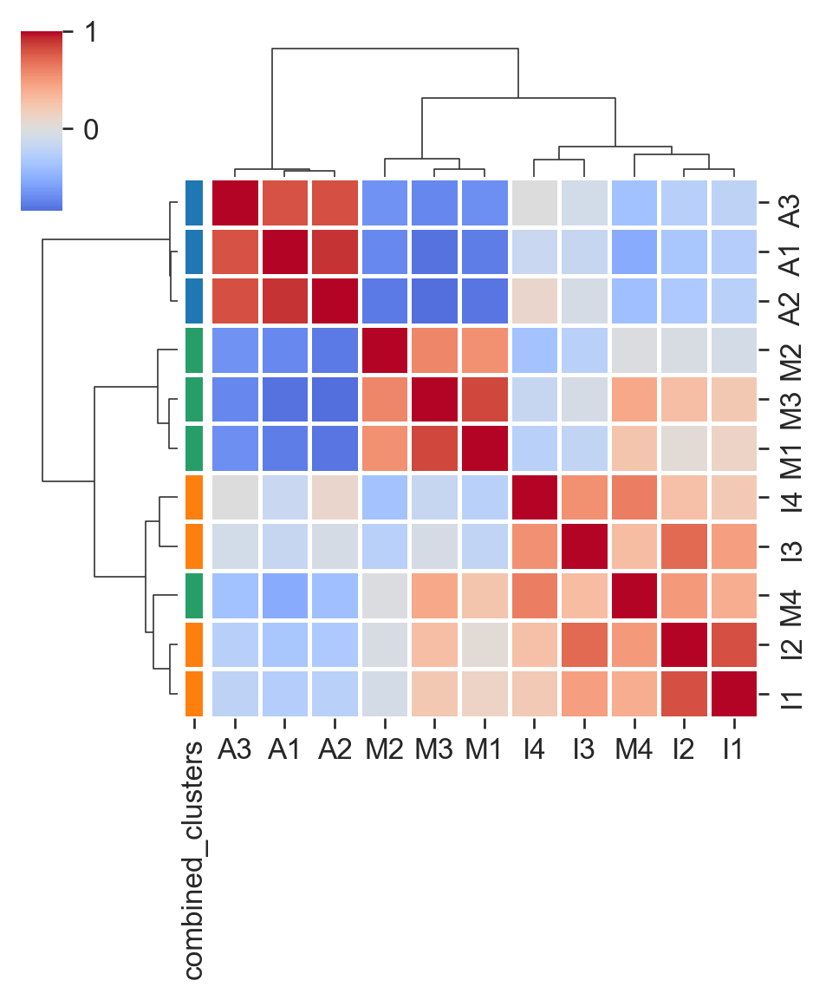

In [35]:
with plt.rc_context():
    f = sns.clustermap(cs, cmap="coolwarm", figsize=(4,4.8), linewidth=1, method='ward', center=0, row_colors=row_colors, xticklabels=True, yticklabels=True)